In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [ ]:
import pandas as pd
df = pd.read_csv('/content/gdrive/MyDrive/Data/UK_international-visits.csv')
df.head()

FileNotFoundError: ignored

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 549853 entries, 0 to 549852
Data columns (total 11 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   year      549853 non-null  object 
 1   quarter   549853 non-null  object 
 2   market    549853 non-null  object 
 3   dur_stay  549853 non-null  object 
 4   mode      549853 non-null  object 
 5   purpose   549853 non-null  object 
 6   area      549853 non-null  object 
 7   visits    549853 non-null  float64
 8   spend     549853 non-null  float64
 9   nights    549853 non-null  float64
 10  sample    549853 non-null  int64  
dtypes: float64(3), int64(1), object(7)
memory usage: 46.1+ MB


In [ ]:
df.isnull().values.any()

False

In [ ]:
# Selecting duplicate rows except first
# occurrence based on all columns
duplicate = df[df.duplicated()]
 
print("Duplicate Rows :")
 
# Print the resultant Dataframe
duplicate

Duplicate Rows :


,year,quarter,market,dur_stay,mode,purpose,area,visits,spend,nights,sample


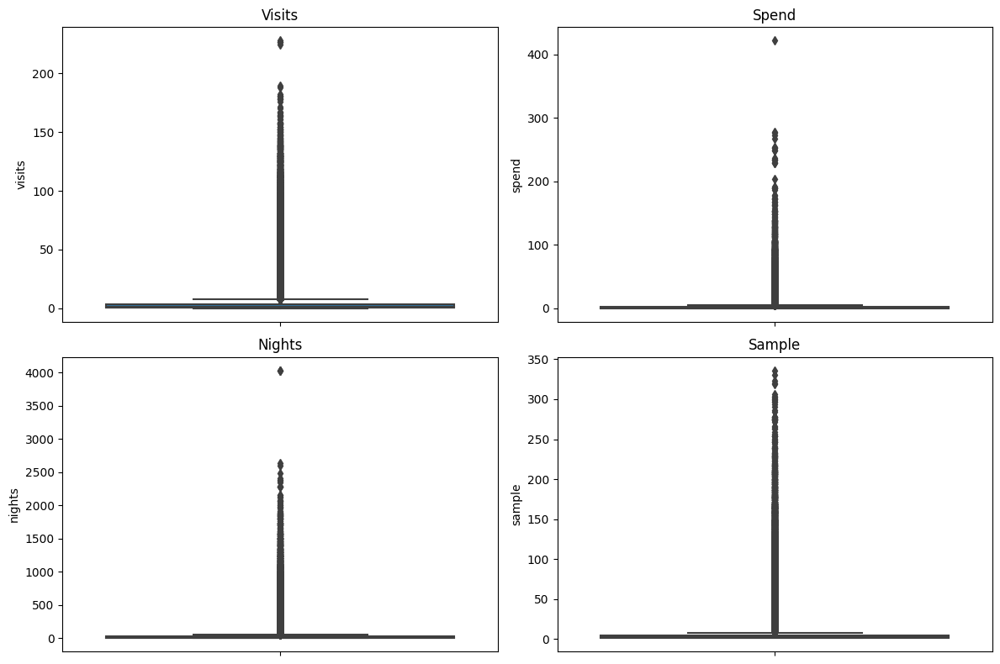

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
sns.boxplot(data=df, y='visits')
plt.title('Visits')

plt.subplot(2, 2, 2)
sns.boxplot(data=df, y='spend')
plt.title('Spend')

plt.subplot(2, 2, 3)
sns.boxplot(data=df, y='nights')
plt.title('Nights')

plt.subplot(2, 2, 4)
sns.boxplot(data=df, y='sample')
plt.title('Sample')

plt.tight_layout()
plt.show()


In [ ]:
import plotly.express as px
fig = px.histogram(df, x='visits')

fig.show()

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Assuming you have a dataframe called 'df' and a list of columns to normalize
columns_to_normalize = ['visits','spend','nights', 'sample']

scaler = MinMaxScaler()
df[columns_to_normalize] = scaler.fit_transform(df[columns_to_normalize])

In [ ]:
df.head()

,year,quarter,market,dur_stay,mode,purpose,area,visits,spend,nights,sample
0,2002.0,January-March,Belgium,1-3 nights,Air,Holiday,TOTAL ENGLAND,4.431616,1.013484,0.002366,0.014925
1,2002.0,January-March,Belgium,1-3 nights,Air,Holiday,LONDON,3.572186,0.969138,0.001726,0.011940
2,2002.0,January-March,Belgium,1-3 nights,Air,Holiday,REST OF ENGLAND,0.859430,0.044346,0.000639,0.000000
3,2002.0,January-March,Belgium,1-3 nights,Air,Holiday,SOUTHERN ENGLAND,0.859430,0.044346,0.000639,0.000000
4,2002.0,January-March,Belgium,1-3 nights,Air,Holiday,SOUTH EAST,0.859430,0.044346,0.000639,0.000000


In [ ]:
df.describe()[['visits', 'spend']]

,nights,sample
count,549853.000000,549853.000000
mean,0.007615,0.011246
std,0.019554,0.034053
min,0.000000,0.000000
25%,0.000749,0.000000
50%,0.002119,0.002985
75%,0.006269,0.008955
max,1.000000,1.000000


In [ ]:
#create a histogram

fig = px.histogram(df, x='visits')

fig.show()

In [ ]:
#checking for outliars

import numpy as np
from scipy import stats

column_name = 'col2'  # Specify the column name where you want to identify outliers

z_scores = np.abs(stats.zscore(df[column_name]))
threshold = 3  # Set your threshold for outliers

# Find the indices of outliers
outlier_indices = np.where(z_scores > threshold)

TypeError: ignored